In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
import sys
sys.path.append("../.")
from geothermal_prediction.utils import save_to_csv
from geothermal_prediction.ml_well_gridsearch import MLFramework


# Load data
data = pd.read_csv('../data/processed/log_data_ml.csv')

# Scenario Parameters
TARGET_COLUMNS = ['Th_Cond', 'Th_Diff']
FEATURE_COLUMNS = [
    'Gamma_Ray_interpolated', 
    'Bulk_Density_interpolated', 
    'Porosity_interpolated',
    'Sonic_Log_interpolated'
]
GROUP_COLUMN = 'Well_ID'
DEPTH_COLUMN = 'Depth'

# Modeling Parameters
METRIC = 'MAE'
NUM_SPLITS = len(data['Well_ID'].unique())  # Number of cross-validation splits
N_TRIALS = 100    # Number of Optuna trials per model-target combination

# Random State for Reproducibility
RANDOM_STATE = 42


# Initialize the framework
framework = MLFramework(
    data=data, 
    target_columns=TARGET_COLUMNS, 
    group_column=GROUP_COLUMN, 
    feature_columns=FEATURE_COLUMNS,
    depth_column=DEPTH_COLUMN,
    metric=METRIC
)

# Define models and their hyperparameter grids

# Ridge Regressor Hyperparameter Grid
param_grid_ridge = {
    'alpha': [0.1, 1, 10, 100],                # Default: 1
    'fit_intercept': [True, False],            # Default: True
    'max_iter': [None, 100, 500, 1000],        # Default: None (no limit)
    'tol': [1e-4, 1e-3, 1e-5],                 # Default: 1e-4
    'solver': ['auto', 'svd', 'cholesky',      # Default: 'auto'
               'lsqr', 'sparse_cg', 'sag',
               'saga']      
}

# Random Forest Regressor Hyperparameter Grid
param_grid_rf = {
    'n_estimators': [100, 200, 300],            # Default: 100
    'max_depth': [None, 10, 20, 30],            # Default: None
    'min_samples_split': [2, 5, 10],            # Default: 2
    'min_samples_leaf': [1, 2, 4],              # Default: 1
    'bootstrap': [True, False],                 # Default: True
    'max_features': [None, 'sqrt', 'log2']      # Default: None
}

# LightGBM Regressor Hyperparameter Grid
param_grid_lgbm = {
    'n_estimators': [100, 250, 500],            # Default: 100
    'max_depth': [-1, 5, 10],                   # Default: -1 (no limit)
    'learning_rate': [0.005, 0.01, 0.1],        # Default: 0.1
    'objective': ['regression', 'huber',        # Default: 'regression'
                  'fair'],
    'boosting_type': ['gbdt', 'dart', 'goss']   # Default: 'gbdt'
}

# XGBoost Regressor Hyperparameter Grid
param_grid_xgb = {
    'n_estimators': [100, 250, 500],            # Default: 100
    'max_depth': [3, 5, 10],                    # Default: 3
    'learning_rate': [0.01, 0.1, 0.2],          # Default: 0.1
    'objective': ['reg:squarederror',           # Default: 'reg:squarederror'
                  'reg:pseudohubererror']  
}

models_with_params = {
    'Ridge': (
        Ridge(random_state=RANDOM_STATE),
        param_grid_ridge
    ),
    'RandomForestRegressor': (
        RandomForestRegressor(random_state=RANDOM_STATE),
        param_grid_rf
    ),
    'LGBMRegressor': (
        LGBMRegressor(random_state=RANDOM_STATE),
        param_grid_lgbm
    ),
    'XGBRegressor': (
        XGBRegressor(random_state=RANDOM_STATE),
        param_grid_xgb
    )
}

# Evaluate models with custom nested CV and get final models
combined_results, final_models = framework.evaluate_models_custom_cv(
    models_with_params=models_with_params,
    num_splits=NUM_SPLITS,       # Number of cross-validation splits
    random_state=RANDOM_STATE
)

# Display combined results
combined_results_df = pd.DataFrame(combined_results).T
save_to_csv(combined_results_df, 'gridsearch_paramgrid', folder='data/results/')

# Collect predictions
results_df = framework.collect_predictions(
    combined_results=combined_results,
    models_with_params=models_with_params,
    num_splits=NUM_SPLITS
)
save_to_csv(results_df, 'gridsearch_results', folder='data/results/')


Evaluating Model: Ridge

Evaluating Hyperparameters: {'alpha': 0.1, 'fit_intercept': True, 'max_iter': None, 'tol': 0.0001, 'solver': 'auto'}
Fold 1, Target Th_Cond, MAE: 0.3551 (n=482)
Fold 1, Target Th_Diff, MAE: 0.4831 (n=482)
Fold 2, Target Th_Cond, MAE: 0.6247 (n=351)
Fold 2, Target Th_Diff, MAE: 0.8231 (n=351)
Fold 3, Target Th_Cond, MAE: 0.4831 (n=270)
Fold 3, Target Th_Diff, MAE: 0.3550 (n=270)
Fold 4, Target Th_Cond, MAE: 0.7713 (n=27)
Fold 4, Target Th_Diff, MAE: 0.4303 (n=27)
Average MAE for {'alpha': 0.1, 'fit_intercept': True, 'max_iter': None, 'tol': 0.0001, 'solver': 'auto'} on target 'Th_Cond': 0.4793
Average MAE for {'alpha': 0.1, 'fit_intercept': True, 'max_iter': None, 'tol': 0.0001, 'solver': 'auto'} on target 'Th_Diff': 0.5568

Evaluating Hyperparameters: {'alpha': 0.1, 'fit_intercept': True, 'max_iter': None, 'tol': 0.0001, 'solver': 'svd'}
Fold 1, Target Th_Cond, MAE: 0.3551 (n=482)
Fold 1, Target Th_Diff, MAE: 0.4831 (n=482)
Fold 2, Target Th_Cond, MAE: 0.6247 

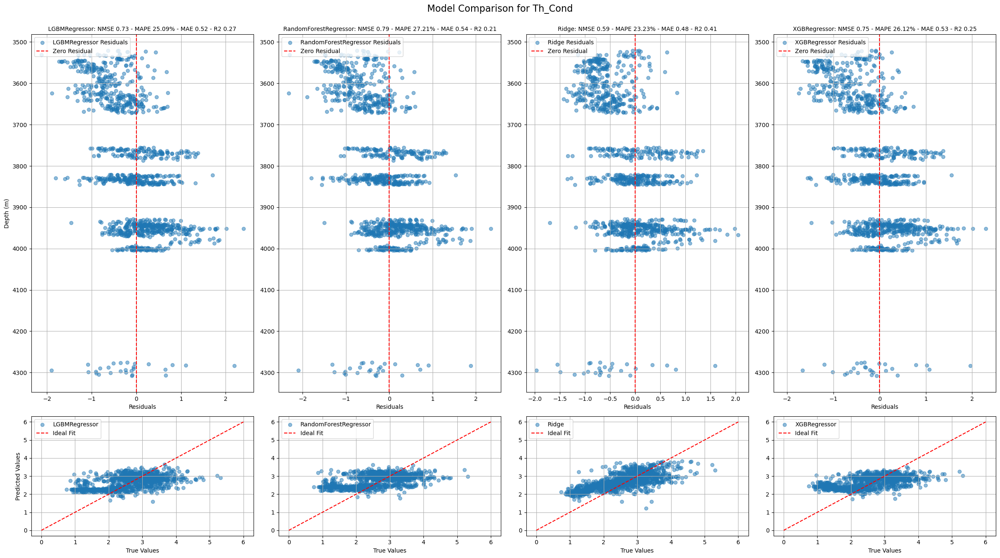

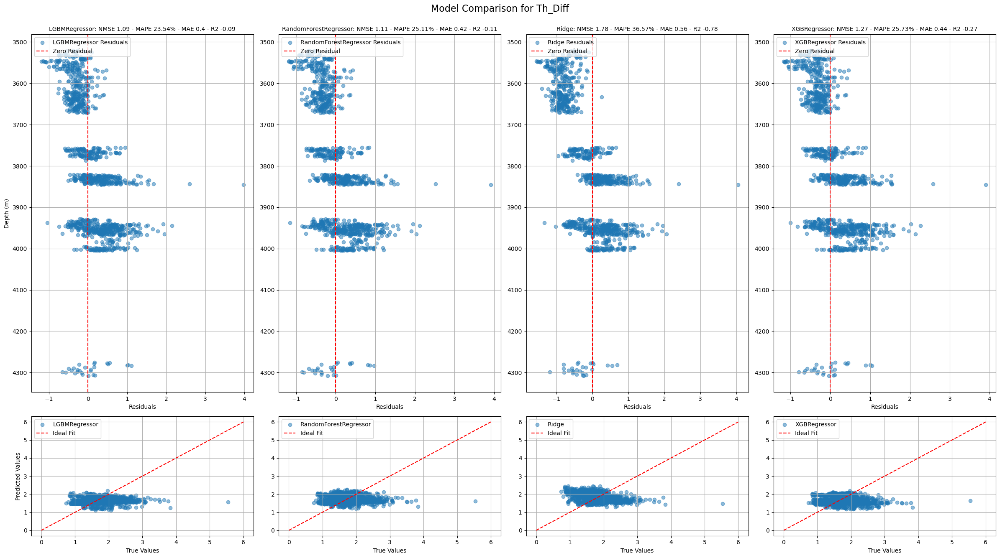

In [2]:
# Plot Model Comparison
framework.plot_model_comparison(results_df)

Well: E18-05


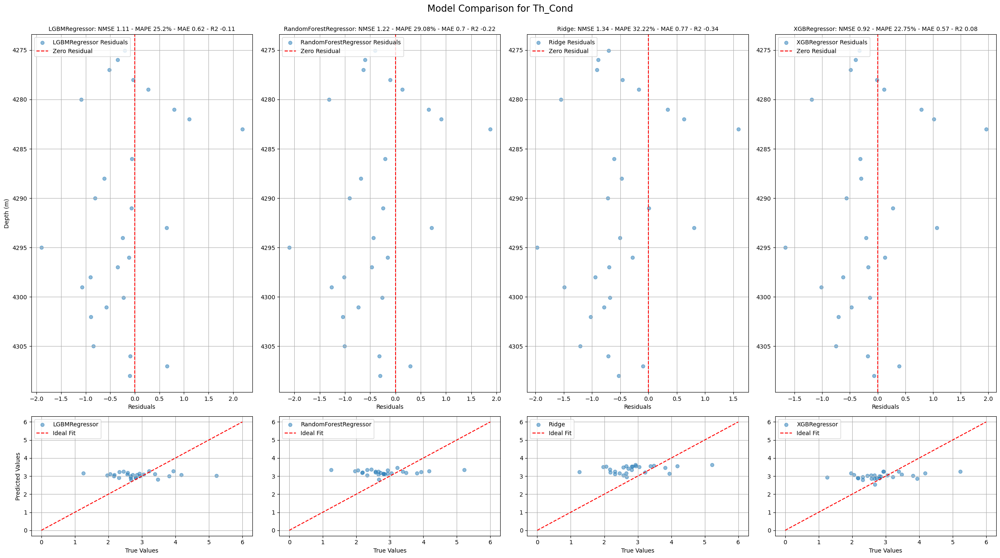

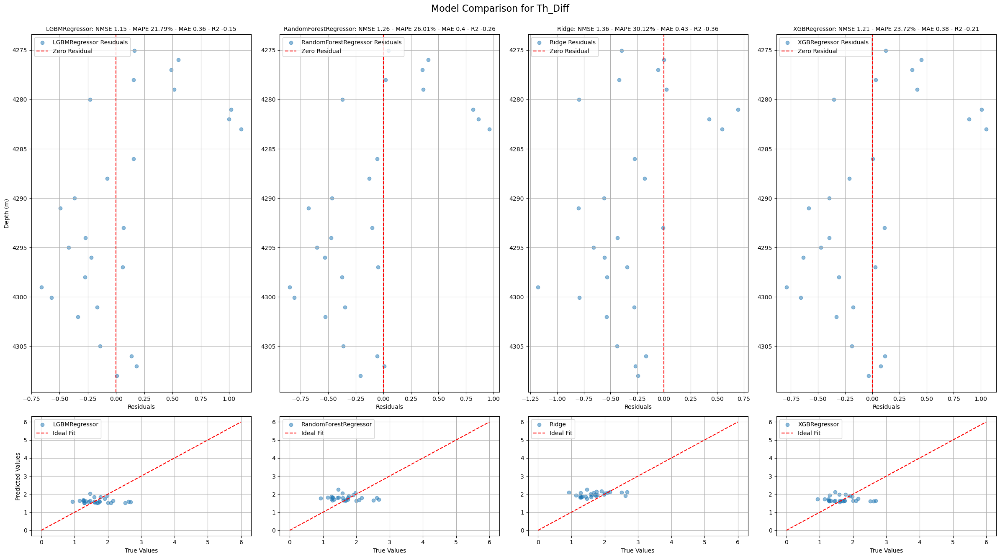

Well: K18-07x


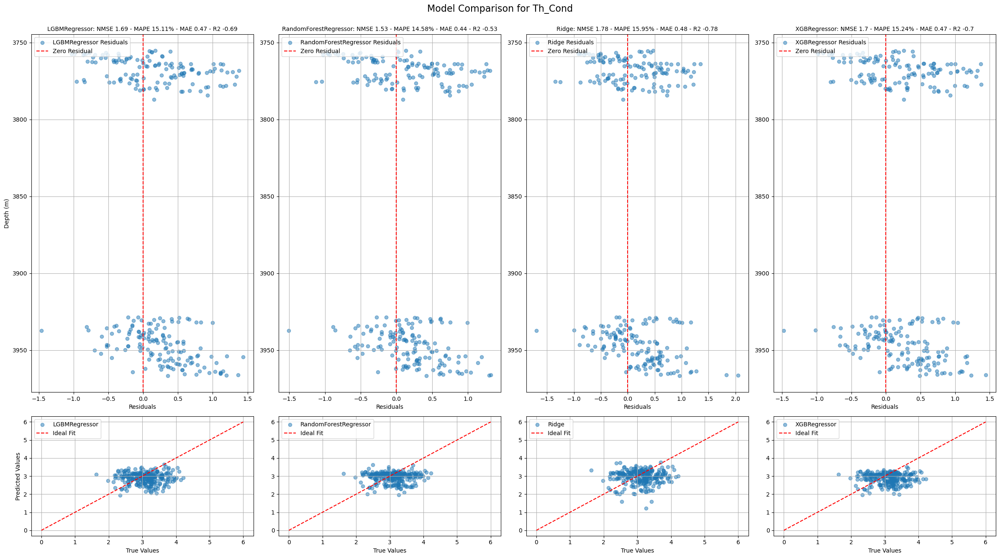

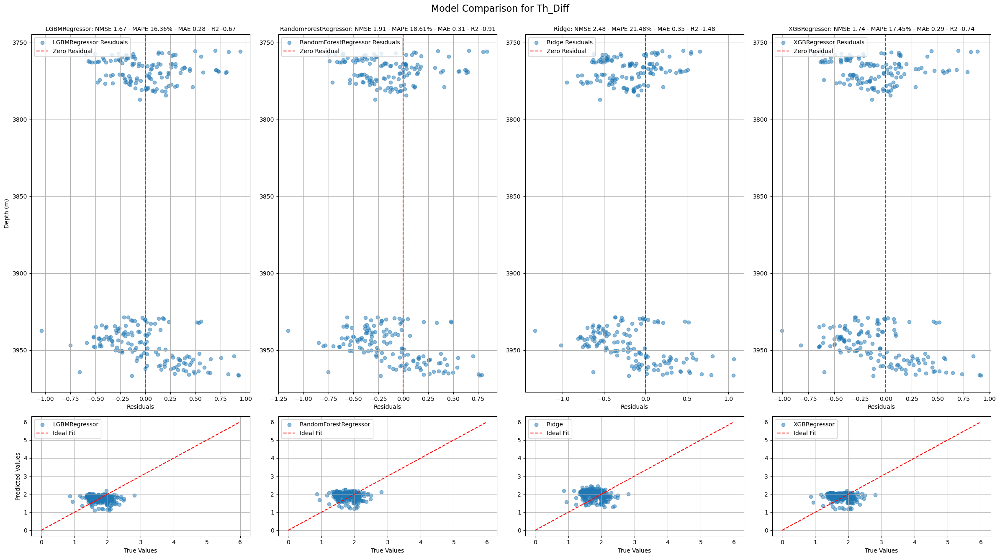

Well: K18-08


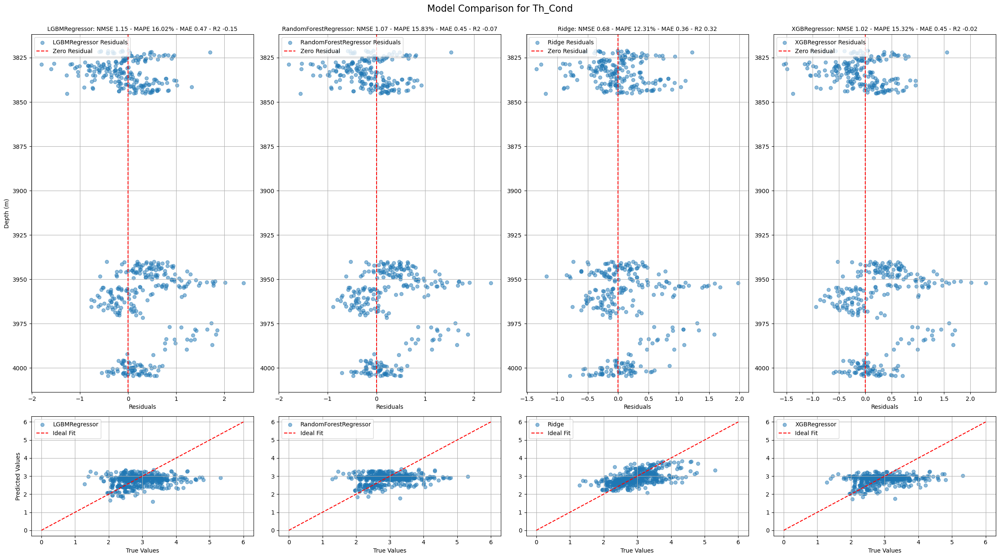

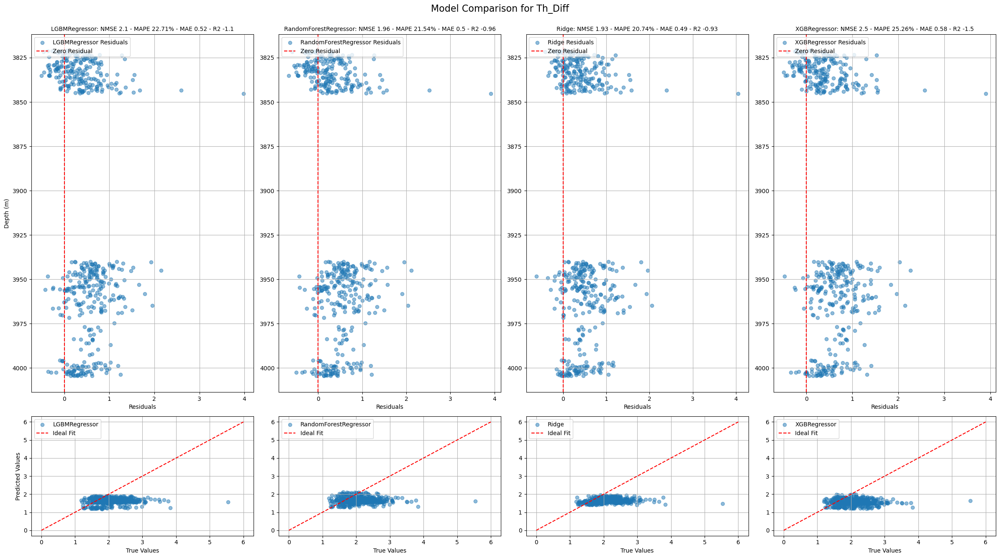

Well: ZRP-03a


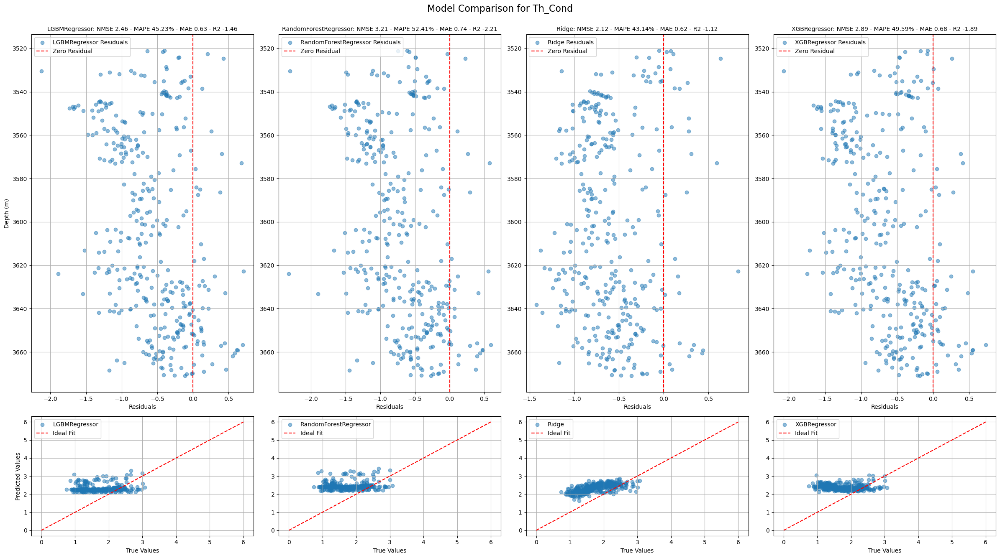

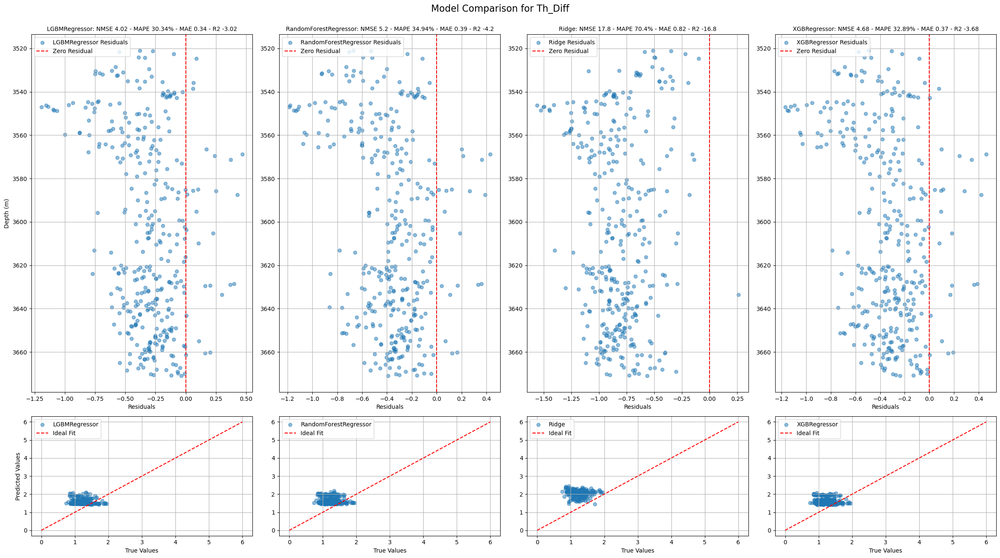

In [3]:
# Plot predictions for each well
for well in results_df['Well_ID'].unique():
    print(f'Well: {well}')
    framework.plot_model_comparison(results_df[results_df['Well_ID'] == well])

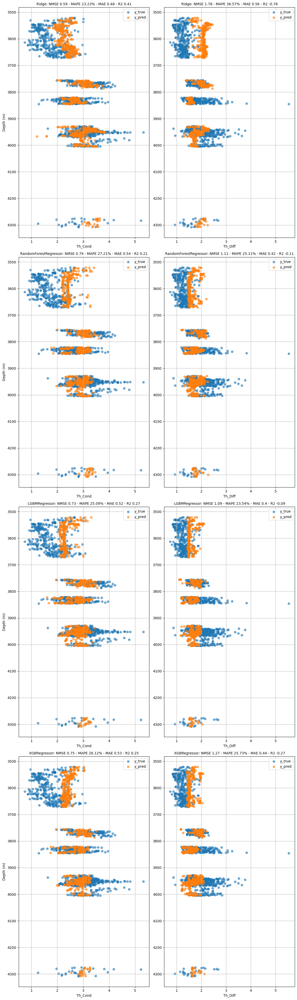

In [4]:
# Plot results
framework.plot_results_predictions(
    predictions_df=results_df,
    targets=TARGET_COLUMNS,  
    models=list(models_with_params.keys()),
    figsize=(15, 10), 
    alpha=0.6
)

Well: E18-05


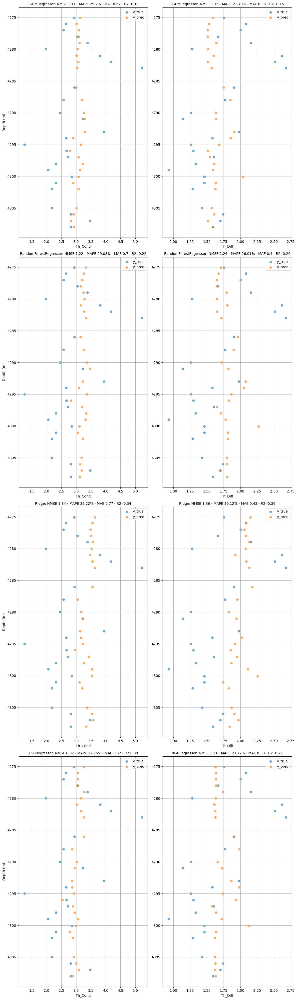

Well: K18-07x


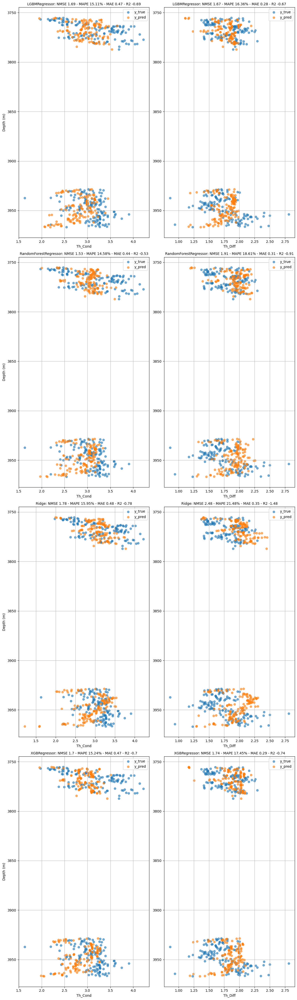

Well: K18-08


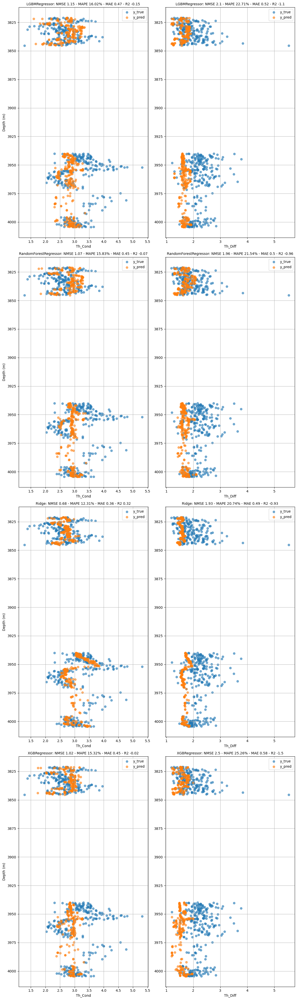

Well: ZRP-03a


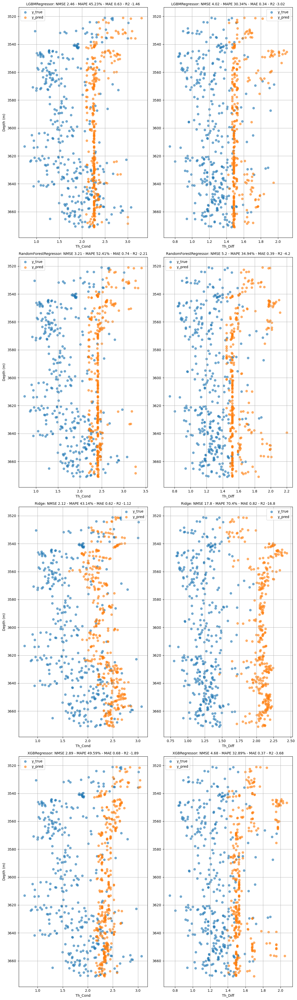

In [5]:
# Plot predictions for each well
for well in results_df['Well_ID'].unique():
    print(f'Well: {well}')
    framework.plot_results_predictions(results_df[results_df['Well_ID'] == well])


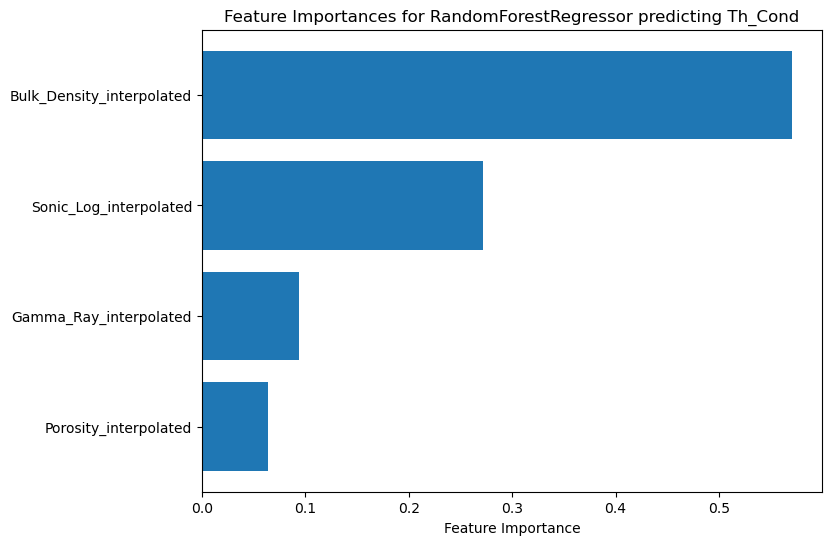

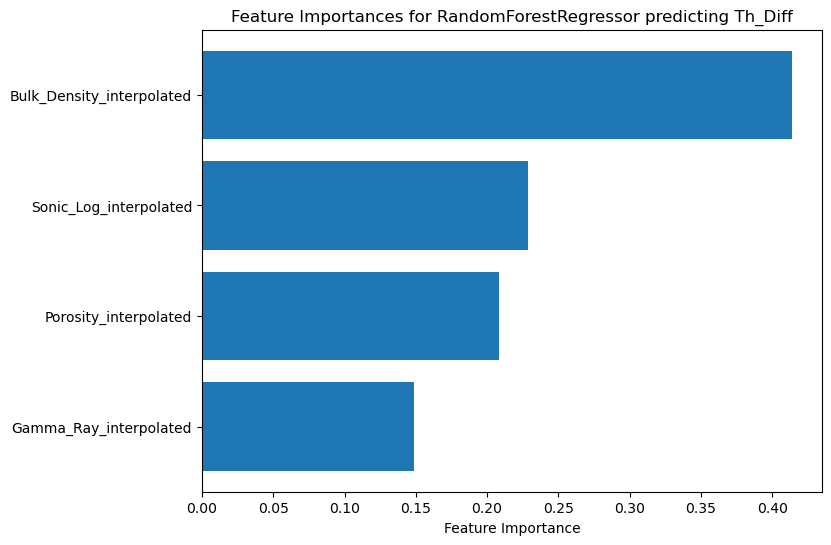

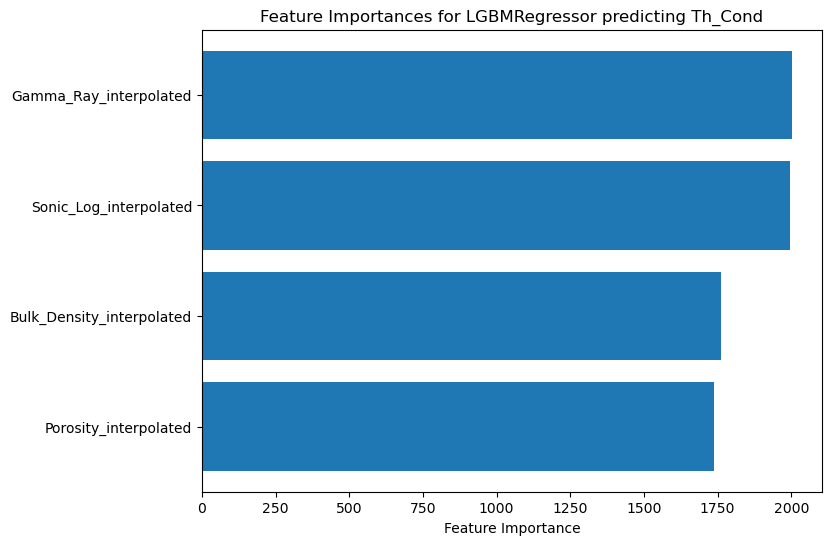

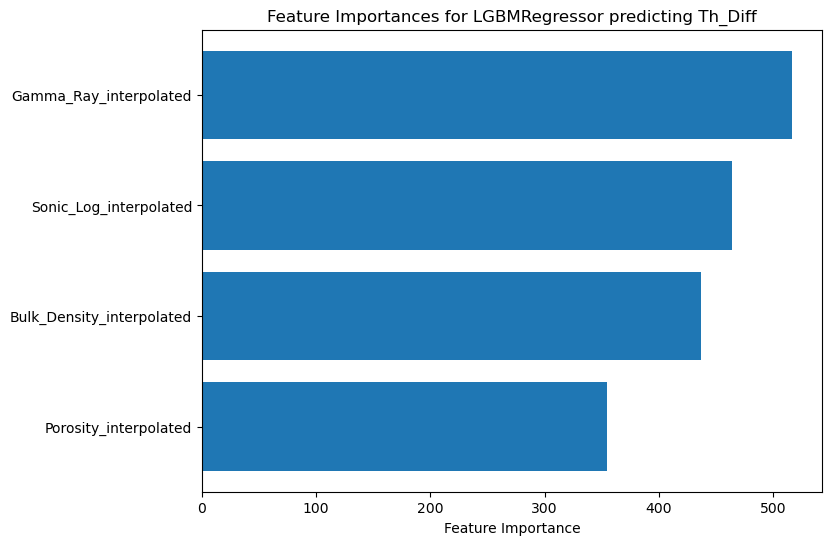

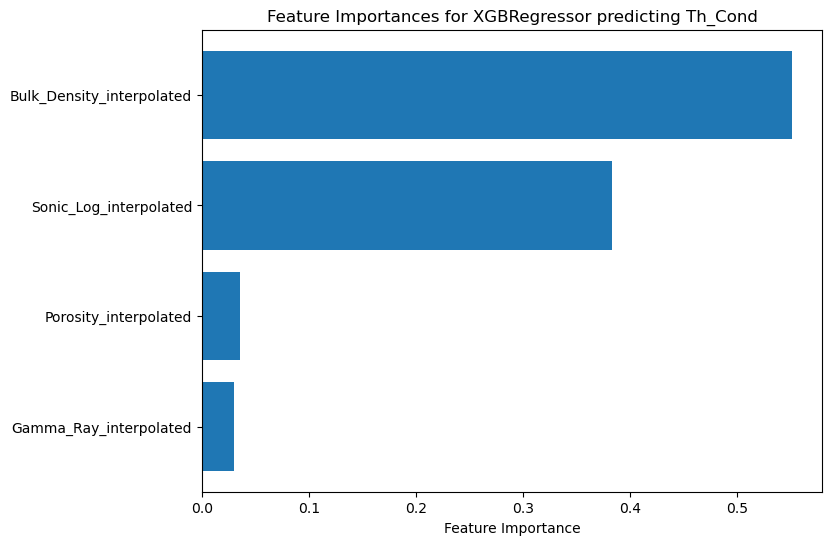

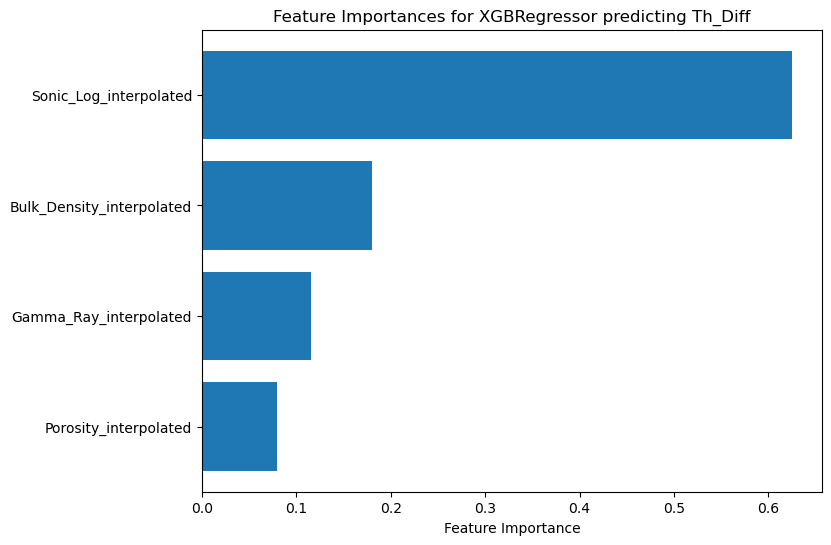

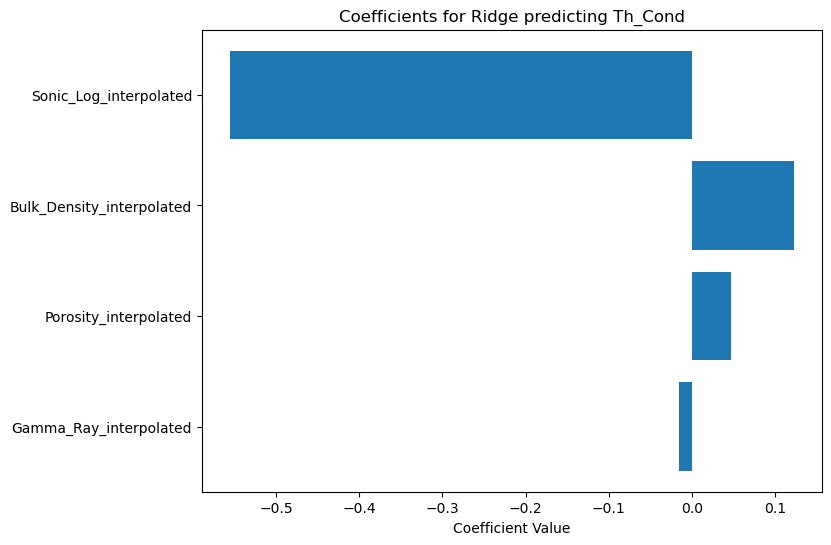

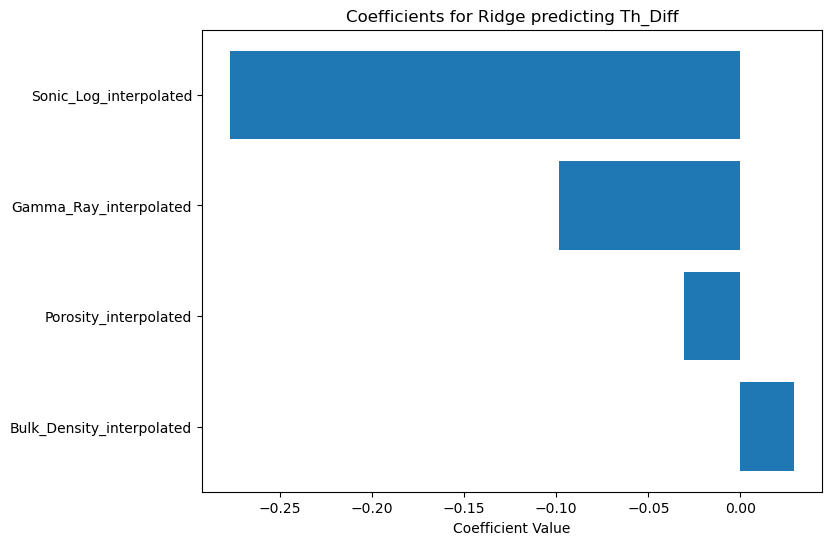

In [6]:
framework.plot_feature_importance(final_models)
framework.plot_coefficients(final_models)